In [3]:
import numpy as np
from matplotlib import pyplot as plt
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import LinearRegression
import scipy
import ECoG
from sklearn.metrics import r2_score
import pywt

import pandas as pd
import time
import pickle

import torch as th
from tqdm import tqdm_notebook
from copy import deepcopy

In [4]:
import plotly.express as px

In [16]:
x,y = ECoG.read_ECoG_from_csv("data/ECoG.csv","data/Motion.csv")

In [17]:
data = ECoG.ECoG(x,y,downsample = True)

In [7]:
filtered = data.bandpass_filter(lowcut=0.2,highcut=60,fs = 100,inplace=True) 

#### Plots

In [8]:
fig_motion = px.scatter_3d(x=data.motion[:4000, 0], y=data.motion[:4000,1], z=data.motion[:4000,2], 
                    color = np.arange(4000))

In [9]:
fig_motion.show()

In [10]:
fig = px.line(x = np.arange(data.signal.shape[0]), y = data.signal[:, 2])

In [11]:
fig.show()

In [12]:
def my_poly(X, deg = 2):
    poly_features = np.ones(shape = (32,1))
    
    for i in range(deg+1):
        for j in range(deg+1):
            if i + j == 0: continue
            temp = X[:,0] ** i * X[:, 1] ** j
            poly_features = np.hstack((poly_features, temp.reshape(-1, 1)))
            
    return poly_features

In [16]:
centers = np.array([[187,168],[190,126],[225,180],[229,141],[264,227],[264,193],[266,152],[282,215],[303,236],
              [303,198],[306,155],[325,221],[325,178],[323,136],[343,246],[349,205],[347,162],[340,120],[365,230],
             [365,185],[362,143],[386,212],[385,164],[380,122],[400,233],[405,190],[405,147],[420,214],[424,165],[424,125],
              [455,165],[460,125]],dtype = 'float')
# sig = np.abs(x[0,1:])
centers[:,0] = (centers[:,0] - centers[:,0].mean())/centers[:,0].std()
centers[:,1] = (centers[:,1]  -centers[:,1].mean())/centers[:,1].std()

In [17]:
res = my_poly(centers)

In [22]:
linear_model = LinearRegression(fit_intercept = False, n_jobs = -1)

In [57]:
new_weights = np.empty(shape = (0, 9))
for signal in tqdm_notebook(data.signal):
    weights = linear_model.fit(res, signal).coef_
    new_weights = np.vstack([new_weights, weights])

In [5]:
data_lm = deepcopy(data)

In [63]:
data_lm.signal = new_weights

In [5]:
%%time
freq = np.linspace(1,14.5,10)
scalo_pw, motion_pw, time_pw = data.scalo(1, freq, start = 0, end = 100000) # preprocess first 3000(30 sec) objects of 

CPU times: user 52min 20s, sys: 5.87 s, total: 52min 26s
Wall time: 52min 42s


In [6]:
X = scalo_pw.reshape((scalo_pw.shape[0],scalo_pw.shape[1]*scalo_pw.shape[2]*scalo_pw.shape[3])) # transform a tensor to a matrix

In [7]:
np.save('zero_data.npy', X)

In [ ]:
X = (X - X.mean())/X.std()
motion_pw = (motion_pw - motion_pw.mean(axis = 0)) / motion_pw.std(axis = 0)

In [5]:
motion_pw = np.load('coord.npy')

In [6]:
X = np.load('zero_data.npy')

In [18]:
div = 10
window_len = int(((1 * 1000 // 100) + 2) * 100//div)

In [23]:
time_pw = data.time[0+window_len:100000]

In [8]:
X_train = X[:70000,:]
Y_train = motion_pw[:70000,:]
Y_test = motion_pw[70000:,:]
X_test = X[70000:,:]

In [24]:
def make_plots(model, X_train, Y_train, X_test, Y_test, dim = 0):
    Y_pred = model.predict(X_train)
    Y_pred_test = model.predict(X_test)
    
    plt.figure(figsize = (19,6))
    plt.plot(time_pw[:70000],Y_pred[:, dim],label = 'predicted')
    plt.plot(time_pw[:70000],Y_train[:, dim],label = 'true')
    plt.title("prediction of train data")
    plt.xlabel('t,sec')
    plt.ylabel('coord')
    plt.legend()
    plt.show()

    plt.figure(figsize = (15,6))
    plt.plot(time_pw[70000:],Y_pred_test[:, dim],label = 'predicted')
    plt.plot(time_pw[70000:],Y_test[:, dim],label = 'true')
    plt.xlabel('t,sec')
    plt.title("prediction of test data")
    plt.ylabel('coord')
    plt.legend()
    plt.show()

    print("Test score = ",[scipy.stats.pearsonr(Y_test[:,i],Y_pred_test[:,i])[0] for i in range(3)])
    print("Train score = ", [scipy.stats.pearsonr(Y_train[:,i],Y_pred[:,i])[0]  for i in range(3)])

In [ ]:
model = PLSRegression(n_components = 40)
model.fit(X_train,Y_train)

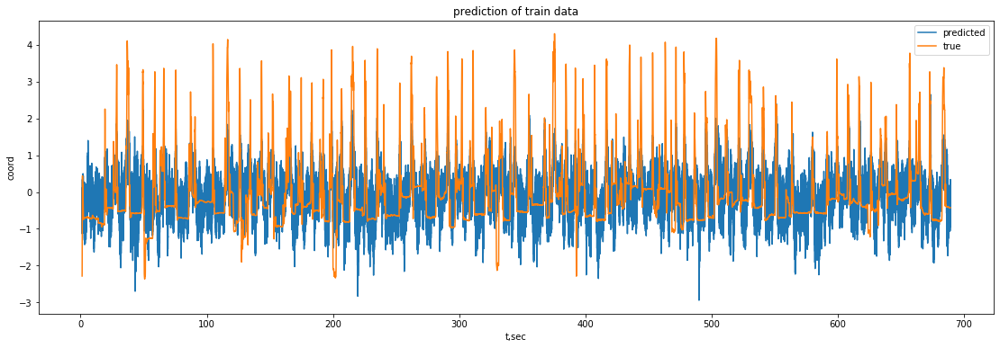

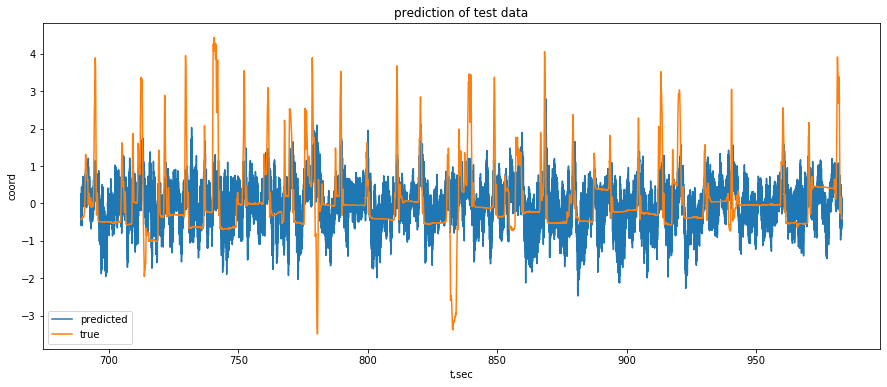

Test score =  [0.3289962270650608, 0.39028446011237033, 0.44508037871098577]
Train score =  [0.5888576467245724, 0.5678502356520467, 0.6344029229212296]


In [25]:
make_plots(model,X_train,Y_train,X_test,Y_test, 0)

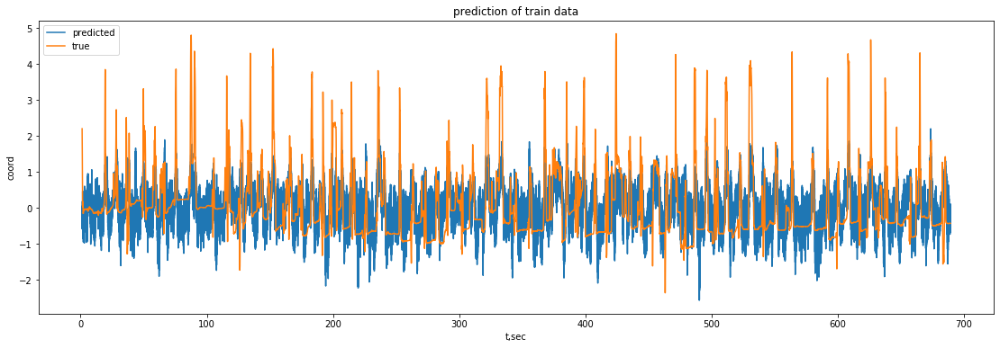

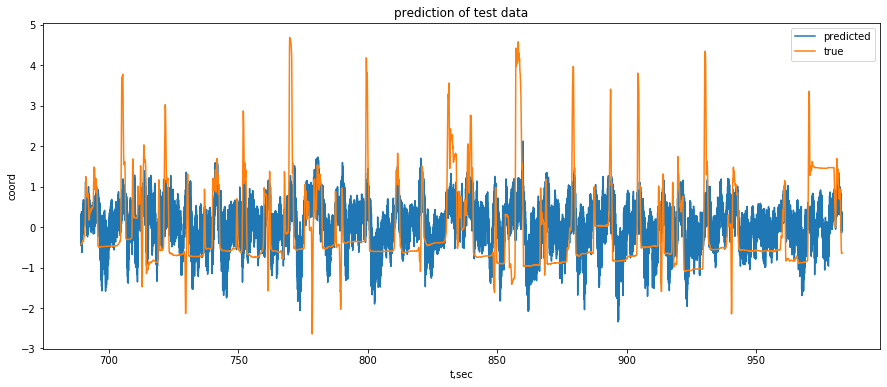

Test score =  [0.3289962270650608, 0.39028446011237033, 0.44508037871098577]
Train score =  [0.5888576467245724, 0.5678502356520467, 0.6344029229212296]


In [26]:
make_plots(model,X_train,Y_train,X_test,Y_test, 1)

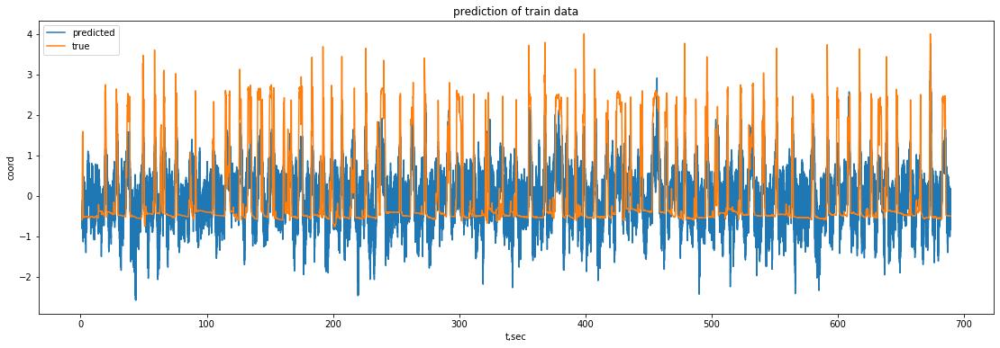

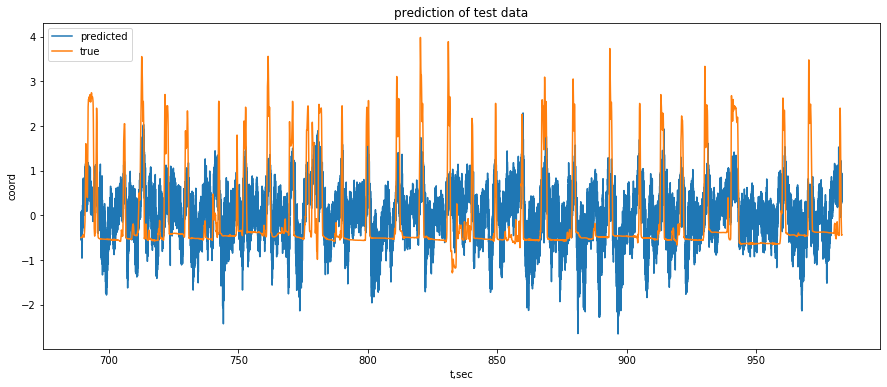

Test score =  [0.3289962270650608, 0.39028446011237033, 0.44508037871098577]
Train score =  [0.5888576467245724, 0.5678502356520467, 0.6344029229212296]


In [27]:
make_plots(model,X_train,Y_train,X_test,Y_test, 2)

In [87]:
# My
Test score =  [0.3727009449197253, 0.4012925659384123, 0.44950956611378684]
Train score =  [0.4935692352994392, 0.5005954399269963, 0.5667159866409075]

SyntaxError: invalid syntax (<ipython-input-87-37878e7275bf>, line 2)

In [ ]:
# Classic

Test score =  [0.3289962270650608, 0.39028446011237033, 0.44508037871098577]
Train score =  [0.5888576467245724, 0.5678502356520467, 0.6344029229212296]

In [ ]:
Test score =  [0.22139768664110487, 0.21793364570665727, 0.3493731694004317]
Train score =  [0.35826540729628503, 0.3902240372620362, 0.4401628209653891]